In [31]:
import os
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import IPython.display as display

Preview the files

In [43]:
perfect = "audiofiles/Perfect - Ed Sheeran.m4a"
aini = "audiofiles/Ai Ni - Kimberly Chen.m4a"
dou = "audiofiles/doushini.mp3"

In [44]:
display.Audio(perfect)

In [45]:
display.Audio(aini)

In [46]:
display.Audio(dou)

Load into Librosa

In [47]:
perfect, sr = librosa.load(perfect,duration=20)
aini, _ = librosa.load(aini,duration=20)
dou, _ = librosa.load(dou,duration=20)

C:\Users\Brandon\miniconda3\envs\tensorflowenv\lib\site-packages\librosa\core\audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


Extract Short Time Fourier Transform (STFT)

In [48]:
FRAME_SIZE = 2048
HOP_SIZE = int(FRAME_SIZE/4) #You can also use 1/2 or 1/4 ratio ... these are common ratios

In [49]:
perfect_stft = librosa.stft(perfect, n_fft=FRAME_SIZE,hop_length=HOP_SIZE)

In [50]:
print(perfect.shape)
print(perfect_stft.shape)

(441000,)
(1025, 862)


From here we see that the STFT has different dimensions
> It is 2D
> <br>It also is only a fraction of the song (denoted by the FRAME_SIZE parameter)

In [52]:
print(perfect_stft[0]) #A row of compelx numbers

[ 0.00000000e+00+0.j  0.00000000e+00+0.j  0.00000000e+00+0.j
  0.00000000e+00+0.j  0.00000000e+00+0.j  0.00000000e+00+0.j
  0.00000000e+00+0.j  0.00000000e+00+0.j  0.00000000e+00+0.j
  0.00000000e+00+0.j  0.00000000e+00+0.j  0.00000000e+00+0.j
  0.00000000e+00+0.j  0.00000000e+00+0.j  0.00000000e+00+0.j
  0.00000000e+00+0.j  0.00000000e+00+0.j  0.00000000e+00+0.j
  0.00000000e+00+0.j  0.00000000e+00+0.j  0.00000000e+00+0.j
  0.00000000e+00+0.j  0.00000000e+00+0.j  0.00000000e+00+0.j
  0.00000000e+00+0.j  0.00000000e+00+0.j  0.00000000e+00+0.j
  0.00000000e+00+0.j  0.00000000e+00+0.j  0.00000000e+00+0.j
  0.00000000e+00+0.j  0.00000000e+00+0.j  0.00000000e+00+0.j
  0.00000000e+00+0.j  0.00000000e+00+0.j  0.00000000e+00+0.j
  0.00000000e+00+0.j  0.00000000e+00+0.j  0.00000000e+00+0.j
  0.00000000e+00+0.j  0.00000000e+00+0.j  0.00000000e+00+0.j
  0.00000000e+00+0.j  0.00000000e+00+0.j  0.00000000e+00+0.j
  0.00000000e+00+0.j  0.00000000e+00+0.j  0.00000000e+00+0.j
  0.00000000e+00+0.j  0.

In [53]:
type(perfect_stft[0][0]) #one entry = single complex number

numpy.complex64

Similar to when we worked with FFT (fast fourier transform) from numpy ... the output is a complex number.

We only really want the real portion and specifically we want the __magnitude__ --> Use np.abs()

In [54]:
Y_scale = np.abs(perfect_stft)**2

In [55]:
Y_scale.shape

(1025, 862)

In [56]:
type(Y_scale[0][0])

numpy.float32

Visualizing the Spectrogram

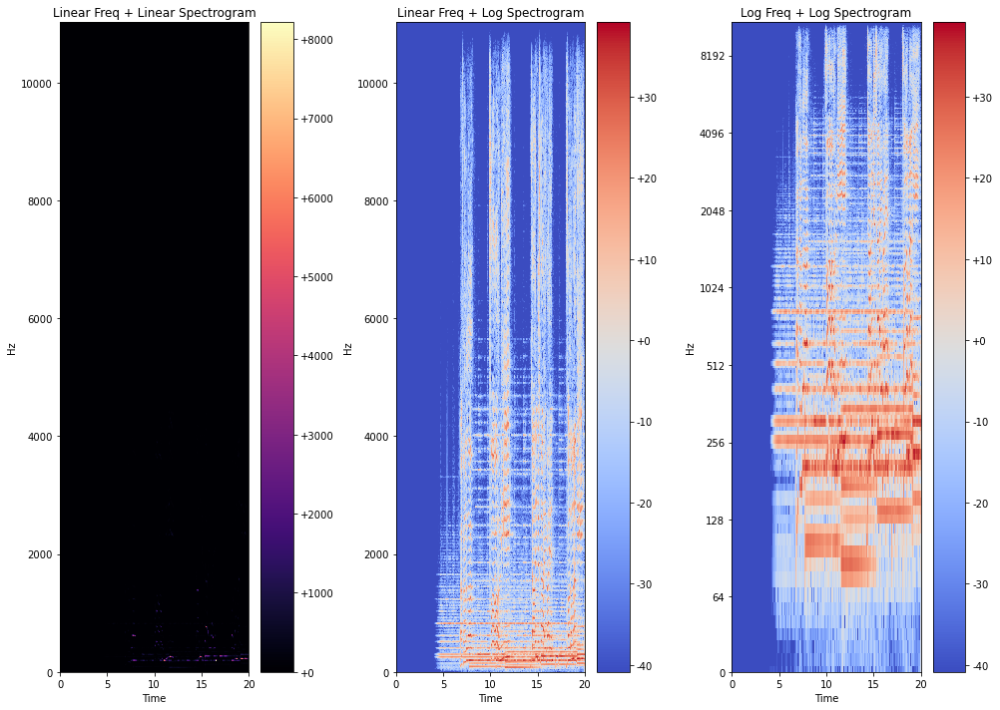

In [63]:
plt.figure(figsize=(14,10))

#Linear Freq + Linear Spectrogram plot
plt.subplot(1,3,1)
librosa.display.specshow(Y_scale,sr=sr,hop_length=HOP_SIZE,x_axis='time',y_axis='linear')
plt.colorbar(format="%+2.f")
plt.title("Linear Freq + Linear Spectrogram")
plt.tight_layout()

#Linear Freq + Log Spectrogram plot
plt.subplot(1,3,2)
Y_log_scale = librosa.power_to_db(Y_scale) #Convert amplitude to logorithmic scale
librosa.display.specshow(Y_log_scale,sr=sr,hop_length=HOP_SIZE,x_axis='time',y_axis='linear')
plt.colorbar(format="%+2.f")
plt.title("Linear Freq + Log Spectrogram")
plt.tight_layout()

#Log Freq + Log Spectrogram plot
plt.subplot(1,3,3)
#Y_log_scale = librosa.power_to_db(Y_scale)
librosa.display.specshow(Y_log_scale,sr=sr,hop_length=HOP_SIZE,x_axis='time',y_axis='log') #Plot a log freq instead of linear
plt.colorbar(format="%+2.f")
plt.tight_layout()
plt.title("Log Freq + Log Spectrogram")
plt.show()

Here we observe that the linear freq and linear spectrogram is quite useless ... why?

- 1) We humans perceive frequency in a log nature
> Ex: C2 to C4 is 65Hz to 262Hz <br>
> meanwhile G6 to A6 is 1568 to 1760 Hz <br>
> Both exhibit a 200Hz difference, but psychoacoustically this is a difference of 2 octaves vs 1 whole step and it DEFEINITELY sounds different to the human ear!
- 2) The intensity/amplitude (colorbar) is converted to log as well because 8000 compared to 0 is quite different!
> Insight: This is decibles (dB) and humans yet again perceive sound in a logorithmic scale and thus, it makes more sense to convert this also to db (as we have via librosa.power_to_db() which literally converts power to dB)

Create a wrapper to plot spectrograms

In [64]:
def plot_spectrogram(song,sr,frame_size,hop_length,y_axis='log'):
    #Compute log magnitude
    stft = librosa.stft(song,hop_length=hop_length,n_fft=frame_size) #Compute STFT
    Y = np.abs(stft)**2 #Convert to magnitude
    Y_log = librosa.power_to_db(Y) #Compute log magnitude
    
    #Create plot
    plt.figure(figsize=(10,6)) #Create figure
    librosa.display.specshow(Y_log,
                            sr=sr,
                            hop_length=hop_length,
                            x_axis='time',
                            y_axis=y_axis)
    plt.colorbar(format="%+2.f")
    plt.title("Spectrogram")
    plt.tight_layout()
    plt.show()

Visualize the final results

C:\Users\Brandon\miniconda3\envs\tensorflowenv\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
C:\Users\Brandon\miniconda3\envs\tensorflowenv\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
C:\Users\Brandon\miniconda3\envs\tensorflowenv\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'linscaley' parameter of __init__() has been renamed 'linscale' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


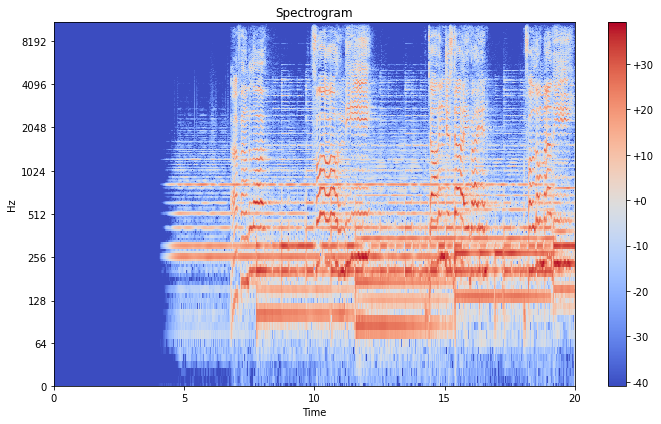

In [68]:
plot_spectrogram(perfect,sr,FRAME_SIZE,HOP_SIZE)

C:\Users\Brandon\miniconda3\envs\tensorflowenv\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
C:\Users\Brandon\miniconda3\envs\tensorflowenv\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
C:\Users\Brandon\miniconda3\envs\tensorflowenv\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'linscaley' parameter of __init__() has been renamed 'linscale' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


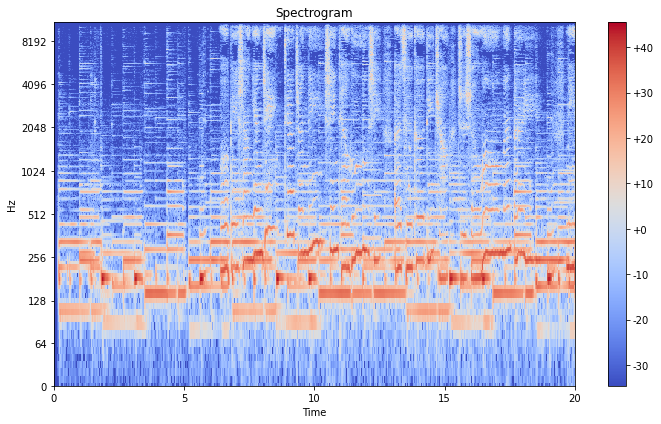

In [66]:
plot_spectrogram(aini,sr,FRAME_SIZE,HOP_SIZE)

C:\Users\Brandon\miniconda3\envs\tensorflowenv\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
C:\Users\Brandon\miniconda3\envs\tensorflowenv\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
C:\Users\Brandon\miniconda3\envs\tensorflowenv\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'linscaley' parameter of __init__() has been renamed 'linscale' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


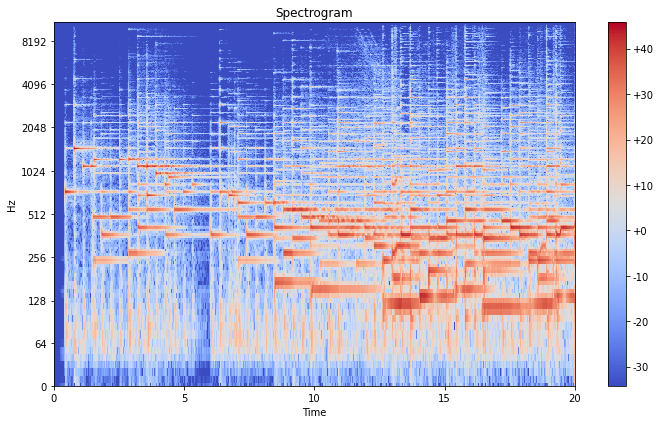

In [67]:
plot_spectrogram(dou,sr,FRAME_SIZE,HOP_SIZE)